<a href="https://www.kaggle.com/code/tompaulat/exploring-images-of-modern-architecture?scriptVersionId=108450775" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Exploring the Modern Architecture Dataset 

In [1]:
import pandas as pd 
import numpy as np 
import os
import matplotlib.pyplot as plt
import cv2 as cv

In [2]:
appart_path = '../input/modern-architecture-100k-small-images/Dataset_128px_128px_Images/Appartments'
public_build_path = '../input/modern-architecture-100k-small-images/Dataset_128px_128px_Images/Public_Buildings'


appart_files = [f for f in os.listdir(appart_path)]
public_build_files = [f for f in os.listdir(public_build_path)]


# Lets select 100 files at random  
random_appartments = np.random.choice(appart_files, 101)
random_public_build = np.random.choice(public_build_files, 101)

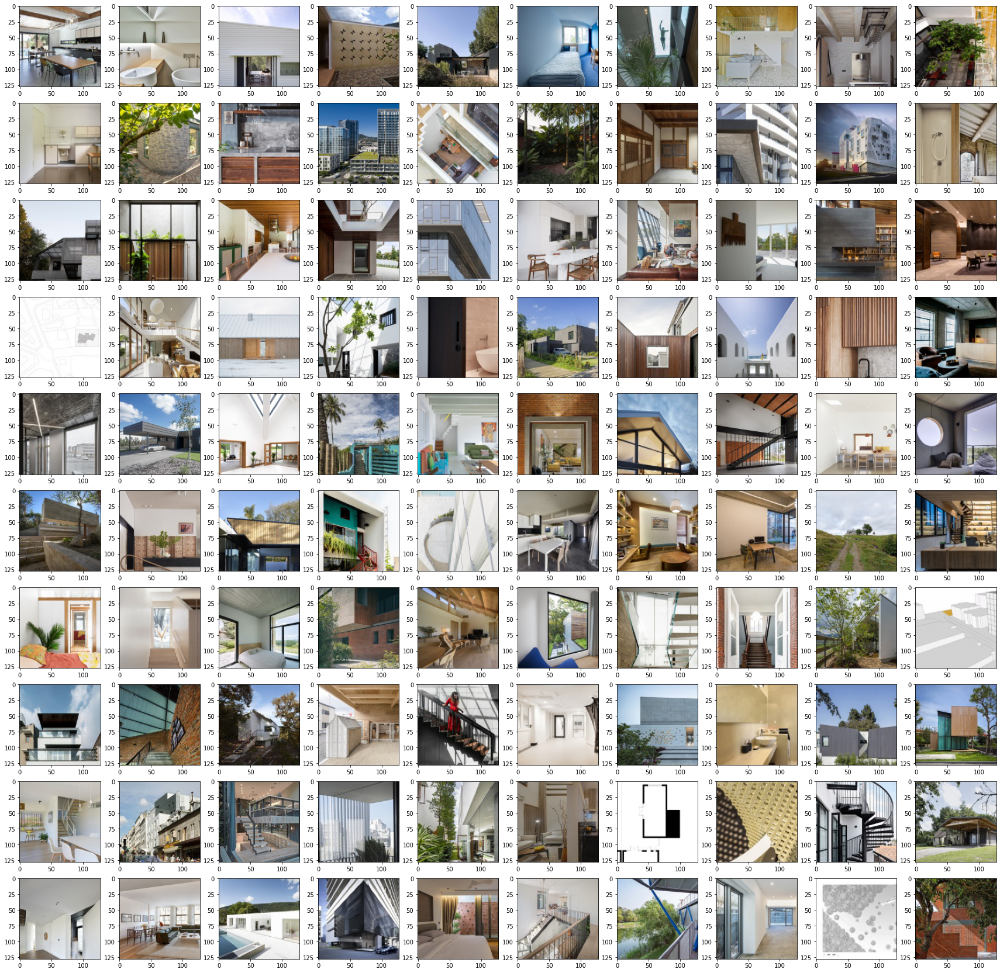

In [3]:
w = 10
h = 10
fig = plt.figure(figsize=(30, 30))
columns = 10
rows = 10
for i in range(1, columns*rows +1):
    img = plt.imread(appart_path + '/' + random_appartments[i])   
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
plt.show()

It is easily seen that there are a diverse range of images including:

- Interior Photography
- Exterior Photography
- Architectural Drawings

The information about the type of image is within the image title.
Lets therefore extract the information from the title.

# Extracting Information from the Image Title

Lets start by examining the first names from the appartmens

In [4]:
appart_files[:3]

['Crescent House Matthew Woodward Architecture Table Chair Bedroom Patio .jpg',
 'St Kilda East Townhouses Jost Architects Windows Bed Bedroom .jpg',
 'Baitasi House of the Future dot Architects Table Windows Beam .jpg']

Lets split each of the words from the strings

In [5]:
# appyling the .split() method
appart_split = [string.split() for string in appart_files]
appart_split[:3]

[['Crescent',
  'House',
  'Matthew',
  'Woodward',
  'Architecture',
  'Table',
  'Chair',
  'Bedroom',
  'Patio',
  '.jpg'],
 ['St',
  'Kilda',
  'East',
  'Townhouses',
  'Jost',
  'Architects',
  'Windows',
  'Bed',
  'Bedroom',
  '.jpg'],
 ['Baitasi',
  'House',
  'of',
  'the',
  'Future',
  'dot',
  'Architects',
  'Table',
  'Windows',
  'Beam',
  '.jpg']]

Now we have a list of lists. If we now count the occurences of each word, we can get a good overview about the data 

In [6]:

# Flattening the appart_split list and defining a set to get unique values
flat_list = [item for sublist in appart_split for item in sublist]
appart_set = set(flat_list)
print(f'There are {len(appart_set)} unique words/identifiers within the dataset')

There are 12709 unique words/identifiers within the dataset


In [7]:
# counting the occurences of each word and creating a dictionary
count_dict = {i:flat_list.count(i) for i in appart_set}

## Visualizing the Frequencies with a Wordcloud 
Lets Visualize the counts of each identifier.

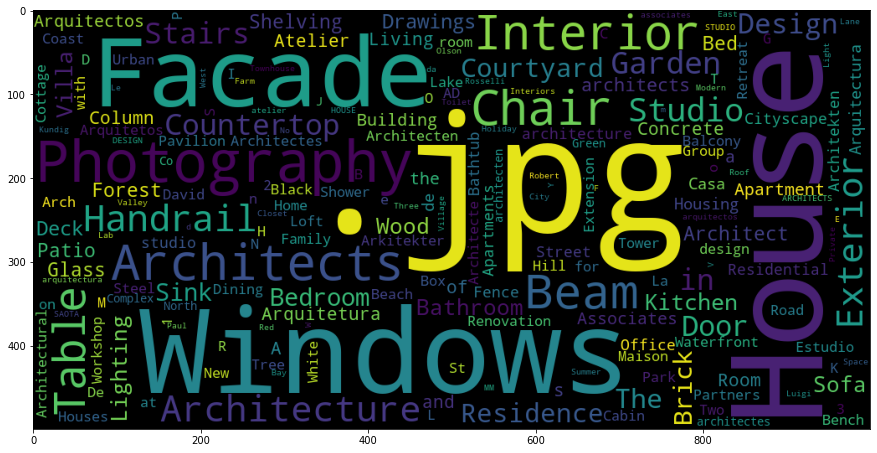

In [8]:
from wordcloud import WordCloud
wordcloud = WordCloud(width = 1000, height = 500).generate_from_frequencies(count_dict)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)

These frequencies can also be loaded in to a Dataframe containg the value counts and sorting it in descending order.

In [9]:
df = pd.DataFrame.from_dict(count_dict, orient='index').reset_index()
df = df.rename(columns={'index':'Identifier', 0:'Image_Count'}).sort_values('Image_Count', ascending=False)
df.head(10)

,Identifier,Image_Count
5744,.jpg,82920
2311,House,46738
9832,Windows,39347
12,Facade,24594
5326,Photography,24233
832,Architects,17309
4181,Chair,16076
2012,Interior,16021
11077,Beam,15652
5660,Table,13406


## What are interesting image identifiers? 
What kind of labels can we be using to construct a Classifier Model?. How about Exterior vs Interior!

In [10]:
df.query('Identifier in ["Exterior", "Interior"]')

,Identifier,Image_Count
2012,Interior,16021
11310,Exterior,8617


# Loadin Image Arrays with OpenCV
To proceed we will build a dataframe of image object (arrays) 

In [11]:
# counter=0
# im_arr_list=[]
# print(len(appart_files))
# for i in appart_files:   
#     print(counter)
#     counter += 1
#     im = cv.imread(appart_path + '/' + i)
#     im_arr_list.append(im)



In [12]:
import pandas as pd 
import numpy as np


In [13]:
df_imgs = pd.DataFrame()
df_imgs['Names']= appart_files
df_imgs['Img_array'] = list(np.load('../input/modern-architecture-100k-small-images/Dataset_128px_128px_Images/Image_Array_Appart.npy'))
df_imgs.head()


,Names,Img_array
0,Crescent House Matthew Woodward Architecture T...,"[[[123, 128, 131], [125, 130, 133], [126, 131,..."
1,St Kilda East Townhouses Jost Architects Windo...,"[[[173, 177, 178], [173, 177, 178], [173, 177,..."
2,Baitasi House of the Future dot Architects Tab...,"[[[33, 34, 44], [29, 30, 40], [31, 32, 42], [3..."
3,House Duurzaamheid Archi3o Chair Handrail .jpg,"[[[216, 212, 207], [214, 210, 205], [215, 211,..."
4,Givatayim Urban Villa Amitzi Architects Table ...,"[[[123, 119, 118], [125, 121, 120], [126, 122,..."


Example of how to plot from the array:

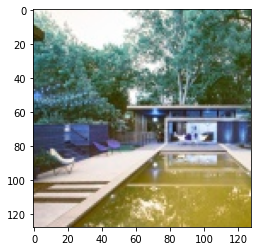

In [14]:
image = df_imgs.Img_array[256]
plt.imshow(image)

Now lets add the information whether the images are label with interior or exterior as additional columns

In [15]:
exterior_list = []
interior_list = []
for i, rows in df_imgs.iterrows():
    if 'Interior' in rows[0]:
        interior_list.append(1)
        exterior_list.append(0)
    elif 'Exterior' in rows[0]:
        interior_list.append(0)
        exterior_list.append(1)
    else: 
        interior_list.append(0)
        exterior_list.append(0)
        
df_imgs['Exterior'] = exterior_list
df_imgs['Interior'] = interior_list

Lets create a smaller dataframe where where either`Interior == 1` or ` Exterior == 1`

In [16]:
df_int_ext = df_imgs.query('Interior == 1 | Exterior == 1').reset_index()
df_int_ext.sample(5)

,index,Names,Img_array,Exterior,Interior
23419,78882,TT Residence FLAT12x Interior Photography Livi...,"[[[55, 67, 79], [96, 111, 127], [114, 138, 158...",0,1
17255,58178,LRVO House Extension Vous Architecture Design ...,"[[[61, 84, 106], [62, 85, 107], [63, 86, 108],...",0,1
12310,41725,2 Single Rooms Ji Architect Interior Photograp...,"[[[103, 112, 116], [102, 111, 115], [101, 110,...",0,1
9318,31638,H House Co lab Design Studio Interior Photogra...,"[[[44, 60, 77], [69, 85, 102], [83, 99, 116], ...",0,1
14763,49757,RHYTHM House APOLLO Architects Associates Inte...,"[[[6, 3, 5], [6, 3, 5], [5, 2, 4], [6, 3, 5], ...",0,1


In [17]:
print(f'There are {df_int_ext.shape[0]} images in total which are either label as Interior ({sum(df_int_ext.Interior)}) or Exterior photography ({sum(df_int_ext.Exterior)}).')


There are 24640 images in total which are either label as Interior (16121) or Exterior photography (8519).


([<matplotlib.patches.Wedge at 0x7f9f07a48810>,
 [Text(0.5124655214493272, 0.9733340070734555, 'Exterior'),
  Text(-0.5124655214493271, -0.9733340070734555, 'Interior')])

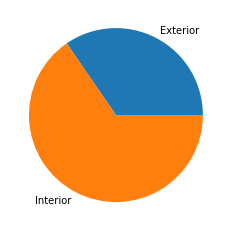

In [18]:
plt.pie([sum(df_int_ext.Exterior), sum(df_int_ext.Interior)], labels= ['Exterior','Interior'])

## Visualizing Example Interior Photographies 

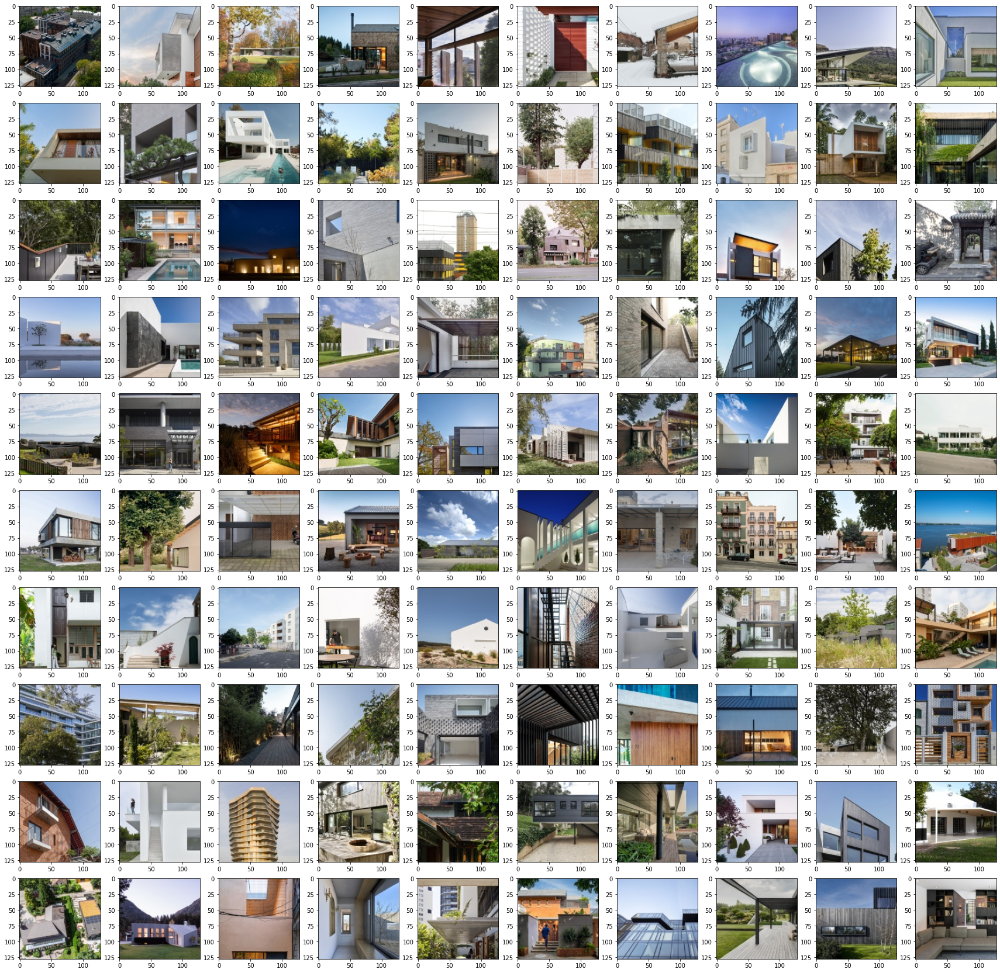

In [19]:
np.random.seed(42)
w = 10
h = 10
fig = plt.figure(figsize=(30, 30))
columns = 10
rows = 10
df_temp = df_int_ext.query('Interior==0 & Exterior==1').reset_index()
for i in range(1, columns*rows +1):
    idx = np.random.randint(df_temp.shape[0])
    fig.add_subplot(rows, columns, i)
    # inverting the color scale with img[...,::-1]
    plt.imshow(df_temp.Img_array[idx][...,::-1])
plt.show()

## Visualizing Example Interior Photographies 

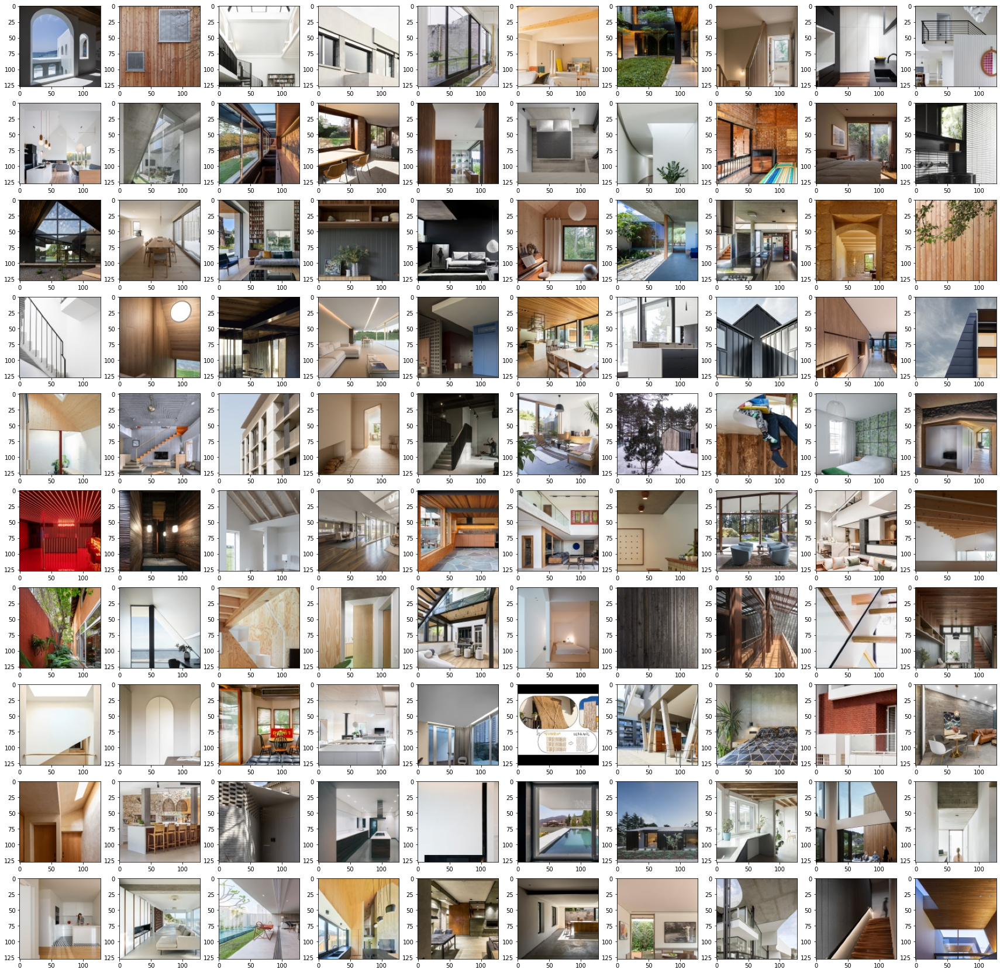

In [20]:
np.random.seed(42)
w = 10
h = 10
fig = plt.figure(figsize=(30, 30))
columns = 10
rows = 10
df_temp = df_int_ext.query('Interior==1 & Exterior==0').reset_index()
for i in range(1, columns*rows +1):
    idx = np.random.randint(df_temp.shape[0])
    fig.add_subplot(rows, columns, i)
    plt.imshow(df_temp.Img_array[idx][...,::-1])
plt.show()

Now these images are ready to be used for Image Classification. 
[**Notebook on CNN-Image-Classification**](https://www.kaggle.com/code/tompaulat/cnn-classifying-architectural-photography)